In [1]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

In [4]:
from plotly.subplots import make_subplots
import sys

from TMSiSDK.file_readers import Poly5Reader
from scipy import signal

In [5]:

import matplotlib.pyplot as plt
from sklearn.decomposition import FastICA, PCA

In [9]:
import os

In [10]:
root_emg_directory = 'C:/Projects/emg_data/TOPSPIN anonymous data/TOPSPIN anonymous data/'

data_draeger = Poly5Reader(os.path.join(root_emg_directory,"M001/007/Draeger_recording.Poly5"))
data_emg = Poly5Reader(os.path.join(root_emg_directory, "M001/001/EMG_recording.Poly5"))

Reading file  C:/Projects/emg_data/TOPSPIN anonymous data/TOPSPIN anonymous data/M001/007/Draeger_recording.Poly5
	 Number of samples:  44993 
	 Number of channels:  3 
	 Sample rate: 100 Hz

Progress:  0.0 %

Progress:  5.9 %

Progress:  11.8 %

Progress:  17.6 %

Progress:  23.5 %

Progress:  29.4 %

Progress:  35.3 %

Progress:  41.2 %

Progress:  47.1 %

Progress:  52.9 %

Progress:  58.8 %

Progress:  64.7 %

Progress:  70.6 %

Progress:  76.5 %

Progress:  82.4 %

Progress:  88.2 %

Progress:  94.1 %
Done reading data.
Reading file  C:/Projects/emg_data/TOPSPIN anonymous data/TOPSPIN anonymous data/M001/001/EMG_recording.Poly5
	 Number of samples:  172576 
	 Number of channels:  3 
	 Sample rate: 2048 Hz

Progress:  0.0 %

Progress:  1.6 %

Progress:  3.1 %

Progress:  4.7 %

Progress:  6.2 %

Progress:  7.8 %

Progress:  9.4 %

Progress:  10.9 %

Progress:  12.5 %

Progress:  14.1 %

Progress:  15.6 %

Progress:  17.2 %

Progress:  18.8 %

Progress:  20.3 %

Progress:  21.9 %

P

## Baseline and drift removal

In [11]:
sos = signal.butter(3, [5,450], 'bandpass', fs=data_emg.sample_rate, output='sos')

emg_filtered = signal.sosfiltfilt(sos, data_emg.samples)

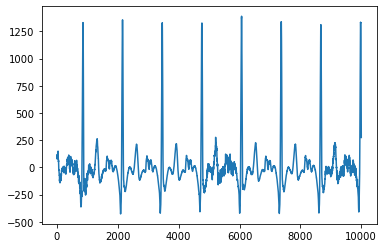

In [27]:
plt.plot(emg_filtered[0][0:10000])

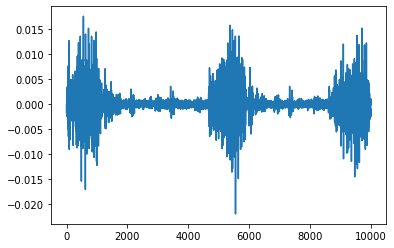

In [28]:
plt.plot(S.T[1][0:10000])

## Filtering artifacts removal

In [29]:
filtered_signal_length = emg_filtered[0].size - data_emg.sample_rate*2 #delete last 2 seconds
emg_filtered=np.delete(emg_filtered, np.s_[filtered_signal_length:], 1)

## EMG using Neurokit

In [13]:
signals, info = nk.emg_process(data_emg.samples[1], sampling_rate=data_emg.sample_rate)

In [14]:
#fig_emg_neurokit = make_subplots(rows=1, cols=1, shared_xaxes=True)

#fig_emg_neurokit.add_trace(go.Scatter (y=signals.EMG_Amplitude[:160000], mode='lines'), row=1, col=1)

#fig_emg_neurokit.update_layout(height=500, title_text="Filtered")
#fig_emg_neurokit.show()

## Manual ECG removal

### High-pass @30Hz

In [15]:
sos = signal.butter(3, [30,450], 'bandpass', fs=data_emg.sample_rate, output='sos')

emg_ecg_filtered = signal.sosfiltfilt(sos, data_emg.samples)

#### Take out filtering arifacts

In [16]:
emg_ecg_filtered=np.delete(emg_ecg_filtered, np.s_[filtered_signal_length:], 1)

In [17]:
#fig_emg_filt = make_subplots(rows=3, cols=1, shared_xaxes=True)

#fig_emg_filt.add_trace(go.Scatter (y=emg_ecg_filtered[0], mode='lines'), row=1, col=1)

#fig_emg_filt.add_trace(go.Scatter (y=emg_ecg_filtered[1], mode='lines'), row=2, col=1)

#fig_emg_filt.add_trace(go.Scatter (y=emg_ecg_filtered[2], mode='lines'), row=3, col=1)

#fig_emg_filt.update_layout(height=500, title_text="Filtered")
#fig_emg_filt.show()

### FAS

#### LMS

#### Filtering ECG

In [18]:
sos = signal.butter(3, [5,60], 'bandpass', fs=data_emg.sample_rate, output='sos')

ecg_filtered = signal.sosfiltfilt(sos, data_emg.samples[0])
ecg_filtered = ecg_filtered[:filtered_signal_length]

#fig_ecg = make_subplots(rows=1, cols=1, shared_xaxes=True)

#fig_ecg.add_trace(go.Scatter (y=ecg_filtered, mode='lines'), row=1, col=1)

#fig_ecg.update_layout(height=500, title_text="Filtered")
#fig_ecg.show()

### ICA

In [20]:
X = np.c_[emg_ecg_filtered[0], emg_ecg_filtered[2]]

# Compute ICA
ica = FastICA(n_components=2)
S = ica.fit_transform(X)  # Reconstruct signals

fig_ica = make_subplots(rows=2, cols=1, shared_xaxes=True)

i=0
for sig in S.T:
    i=i+1
    fig_ica.add_trace(go.Scatter (y=sig, mode='lines'), row=i, col=1)

fig_ica.update_layout(height=500, title='Decomposed signals')
#fig_ica.show()

In [100]:
ecg_filtered_sample = S.T[1]

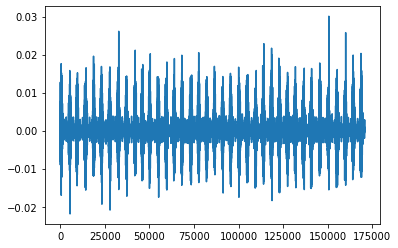

In [101]:
plt.plot(ecg_filtered_sample)

In [102]:
def show_my_power_spectrum(sample, sample_rate):
    N = len(sample)
    # for our emg samplerate is 2048

    yf = fft((S.T[1]))
    xf = fftfreq(N, 1 / sample_rate)

    plt.plot(xf, np.abs(yf))
    plt.xlim(0,)
    plt.show()

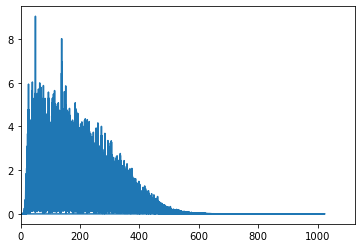

In [103]:
show_my_power_spectrum(ecg_filtered_sample, 2048)

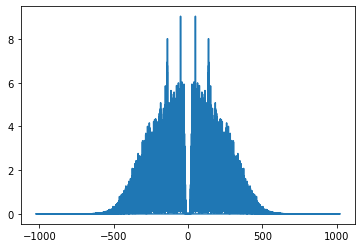

In [104]:
# let look deeply into our chosen sample

N = len(S.T[1])

yf = fft((S.T[1]))
xf = fftfreq(N, 1 / SAMPLE_RATE)

plt.plot(xf, np.abs(yf))
plt.show()

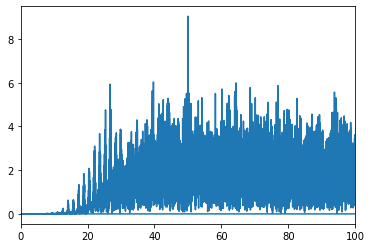

In [105]:
# looking for known power line interference (around 50)
plt.plot(xf, np.abs(yf))
plt.xlim(0,100)
plt.show()

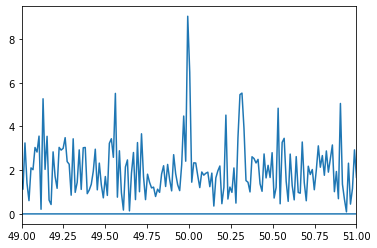

In [106]:
# The power line spike is there, let's look more closely
plt.plot(xf, np.abs(yf))
plt.xlim(49,51)
plt.show()

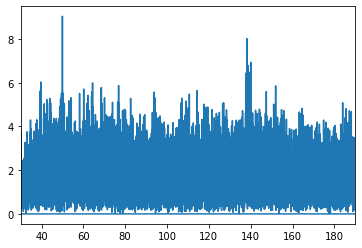

In [107]:
# whats the other peak?
plt.plot(xf, np.abs(yf))
plt.xlim(30,190)
plt.show()

In [108]:
# not so clear, may have to do with real signal
# so we need a notch filter



In [79]:
def notch_filter(sample, sample_frequ, freq_to_pull, quality_factor_q):
    # create notch filter
    samp_freq = sample_frequ # Sample frequency (Hz)
    notch_freq = freq_to_pull # Frequency to be removed from signal (Hz)
    quality_factor = quality_factor_q # Quality factor

    # design a notch filter using signal.iirnotch
    b_notch, a_notch = signal.iirnotch(notch_freq, quality_factor, samp_freq)

    # compute magnitude response of the designed filter
    freq, h = signal.freqz(b_notch, a_notch, fs=samp_freq)
    # make the output signal
    output_signal = signal.filtfilt(b_notch, a_notch, sample)
    return output_signal


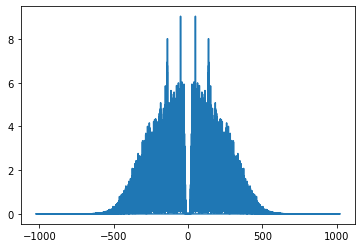

In [109]:
yf = fft((ecg_filtered_sample))
xf = fftfreq(N, 1 / SAMPLE_RATE)

plt.plot(xf, np.abs(yf))
plt.show()

In [110]:
double_filtered = notch_filter(ecg_filtered_sample, 2048, 50, 30 )

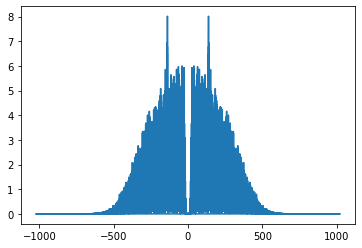

In [111]:
yf = fft((double_filtered))
xf = fftfreq(N, 1 / SAMPLE_RATE)

plt.plot(xf, np.abs(yf))
plt.show()